In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import isic
from isic import printenc, println, printdash

SEED = 6

In [2]:
printenc(
"""\
Create full set

Note that this full set is naively merged and doesn't have all the processing
of the actual uploaded set.\
""")

ds_24 = isic.get_2024()
md_24 = ds_24.get_proc_metadata()

ds_cp = isic.get_complete()
md_cp = ds_cp.get_proc_metadata()

md_full = pd.concat([md_24, md_cp], axis=0).reset_index(drop=True)

printenc("Inspect combined metadata: Non-existing values filled with NAN.",
         md_full)

dup = md_full[md_full.duplicated("isic_id")]

printenc("Number of overlapping isic_ids",
         dup.shape[0])

--------------------
Create full set

Note that this full set is naively merged and doesn't have all the processing
of the actual uploaded set.
--------------------
--------------------
Inspect combined metadata: Non-existing values filled with NAN.
             isic_id  target  patient_id  age_approx     sex  \
0       ISIC_0015670     0.0  IP_1235828        60.0    male   
1       ISIC_0015845     0.0  IP_8170065        60.0    male   
2       ISIC_0015864     0.0  IP_6724798        60.0    male   
3       ISIC_0015902     0.0  IP_4111386        65.0    male   
4       ISIC_0024200     0.0  IP_8313778        55.0    male   
...              ...     ...         ...         ...     ...   
482776  ISIC_0000004     NaN         NaN        80.0    male   
482777  ISIC_0000003     NaN         NaN        30.0    male   
482778  ISIC_0000002     NaN         NaN        60.0  female   
482779  ISIC_0000001     NaN         NaN        30.0  female   
482780  ISIC_0000000     NaN         NaN      

In [3]:
printenc(
"""\
Study mixed-type columns

These are a pain in the butt and will cause errors will HF Dataset.

TYPES OF MIXED COLUMNS:
- bool/float
- str/float
- str/pandas._libs.missing.NAType

HAVE CHECKED THAT ALL FLOATS IN LIST ABOVE GIVE NAN.

SOLUTION:
- cast boolean columns to float, keep na
- cast na to "" in string columns\
""")

printdash()
print("Full set dtype analysis")
md_full.info(verbose = True)
printdash()

all_nan = True
printenc("dtype statistics on each mixed-type column")
for col in sorted(md_full.columns.values):
    if len(md_full[col].apply(type).unique()) > 1:
        printdash()
        print(md_full[col].apply(type).value_counts(dropna = False, sort = False))
        print('pandas column type:', md_full[col].dtype)

        num_nan = md_full[col].isna().sum()

        num_other = md_full.shape[0] - md_full[col].apply(isinstance, args = (str,)).sum()
        num_other = num_other - md_full[col].apply(isinstance, args = (bool,)).sum()

        print("nan count == other type count: ", num_nan == num_other)
        all_nan = all_nan and (num_nan == num_other)
        printdash()

printenc("All 'alternative types' are nan:", all_nan)

--------------------
Study mixed-type columns

These are a pain in the butt and will cause errors will HF Dataset.

TYPES OF MIXED COLUMNS:
- bool/float
- str/float
- str/pandas._libs.missing.NAType

HAVE CHECKED THAT ALL FLOATS IN LIST ABOVE GIVE NAN.

SOLUTION:
- cast boolean columns to float, keep na
- cast na to "" in string columns
--------------------
--------------------
Full set dtype analysis
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 482781 entries, 0 to 482780
Data columns (total 73 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       482781 non-null  object 
 1   target                        401059 non-null  float64
 2   patient_id                    442187 non-null  object 
 3   age_approx                    477963 non-null  float64
 4   sex                           469355 non-null  object 
 5   anatom_site_general           460046 non-null  object 
 6  

In [4]:
printenc(
"""\
General statistics of shared columns in the full set

Don't need other columns as they will just have more nan's compared to
their counterparts in 2024/complete.

I haven't really used this tbh.\
"""
)

cols_24 = set(md_24.columns.values)
cols_cp = set(md_cp.columns.values)
cols_shared = cols_24 & cols_cp

for col in sorted(cols_shared):
    printenc(f"Statistics for column [{col}]",
             isic.dtype_based_stats(md_full, col))

--------------------
General statistics of shared columns in the full set

Don't need other columns as they will just have more nan's compared to
their counterparts in 2024/complete.

I haven't really used this tbh.
--------------------
--------------------
Statistics for column [PROC_source]
PROC_source
2024        401059
complete     81722
Name: count, dtype: int64
--------------------
--------------------
Statistics for column [PROC_use]
PROC_use
training    401059
             81722
Name: count, dtype: int64
--------------------
--------------------
Statistics for column [age_approx]
count    477963.000000
mean         56.318188
std          15.303215
min           0.000000
25%          45.000000
50%          55.000000
75%          65.000000
max          85.000000
Name: age_approx, dtype: float64
Number of nan: 4818
Unique values: 19
--------------------
--------------------
Statistics for column [anatom_site_general]
anatom_site_general
posterior torso    135541
lower extremity   

In [5]:
printenc("Import fully processed metadata")
METADATA_FILE = 'data/isic/metadata_full.json'
md_final = pd.read_json(METADATA_FILE)

--------------------
Import fully processed metadata
--------------------


--------------------
Study duplicated lesion_ids

Note that for samples with no lesion_id we will never know
what the situation is.

THERE ARE SAMPLES WHERE CONFLICTING DIAGNOSES HAVE BEEN GIVEN!

But the number of those samples is really small and perhaps reflects an uncertainty in the diagnosis.
I'd just say not to worry about it...

There are only 52 samples in the 2024 set that have duplicate lesion_ids,
and they all have their counterparts in the archive set.
COMPARING THESE WILL GIVE US INSIGHT TO WHAT TRANSFORMS WE NEED.
--------------------
--------------------
Duplicate statistics (how many duplicates in each lesion_id?)
1     44194
2      3682
3      1459
4       502
5       373
6       202
7       113
8        62
9        56
10       26
12       19
11       18
13       11
14        7
20        6
19        6
17        5
15        3
16        3
18        3
24        1
27        1
31        1
26        1
21        1
Name: count, dtype: int64
--------------------
---------------

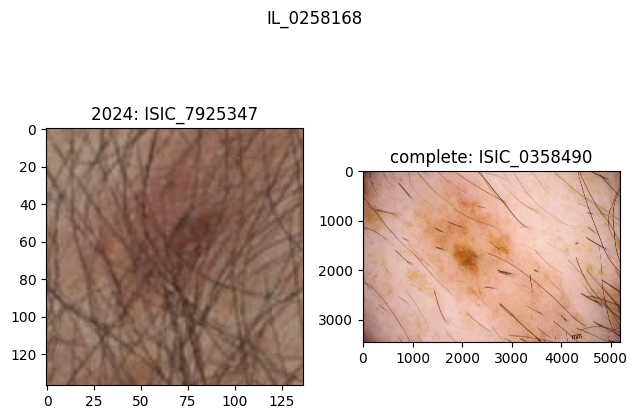

        lesion_id       isic_id PROC_source benign_malignant diagnosis
3139   IL_0325434  ISIC_3832733        2024        malignant  melanoma
10366  IL_0325434  ISIC_6892286    complete        malignant  melanoma



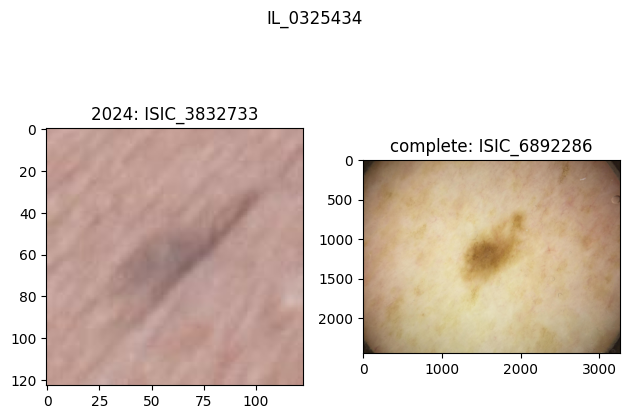

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7493   IL_1210569  ISIC_9115120        2024           benign          
35577  IL_1210569  ISIC_6428021    complete           benign          



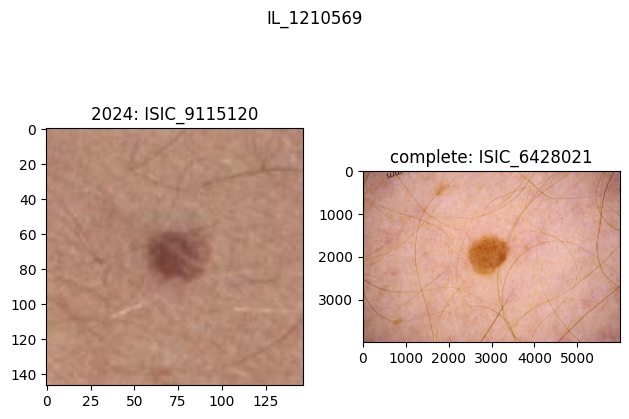

        lesion_id       isic_id PROC_source benign_malignant diagnosis
3249   IL_1234788  ISIC_3964079        2024        malignant  melanoma
10834  IL_1234788  ISIC_7254359    complete        malignant  melanoma



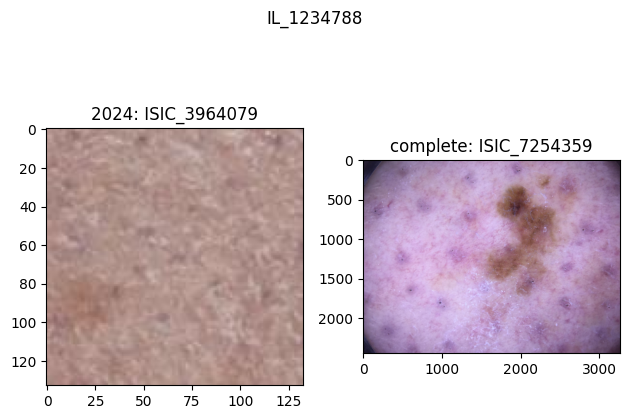

        lesion_id       isic_id PROC_source benign_malignant diagnosis
5200   IL_1261527  ISIC_6270599        2024           benign          
41827  IL_1261527  ISIC_5327271    complete           benign          



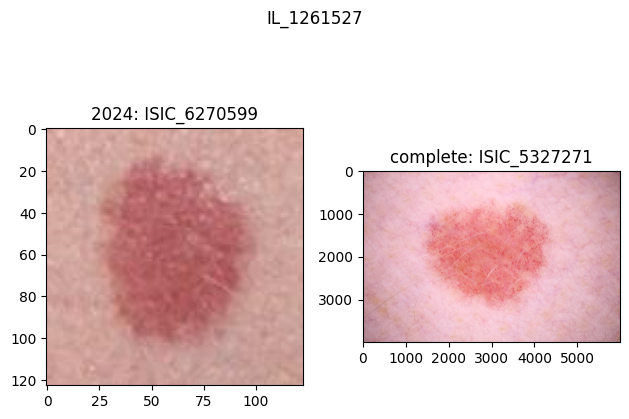

        lesion_id       isic_id PROC_source benign_malignant diagnosis
2159   IL_1428795  ISIC_2620684        2024        malignant  melanoma
10443  IL_1428795  ISIC_6668093    complete        malignant  melanoma



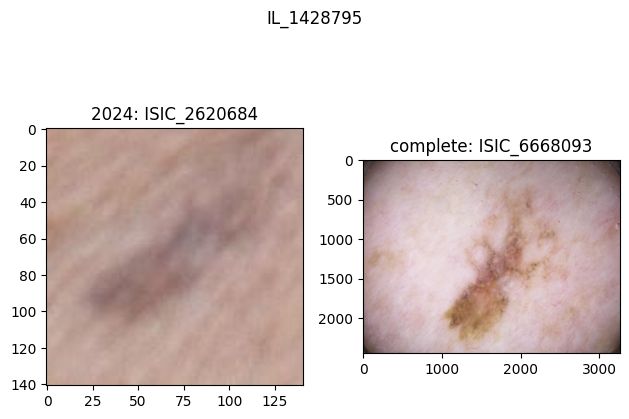

        lesion_id       isic_id PROC_source benign_malignant diagnosis
2726   IL_1708492  ISIC_3304099        2024           benign          
42074  IL_1708492  ISIC_9566964    complete           benign          



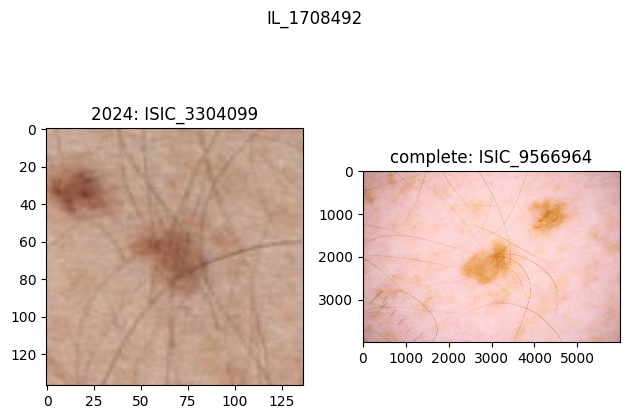

        lesion_id       isic_id PROC_source benign_malignant  \
2275   IL_2039298  ISIC_2746016        2024        malignant   
10419  IL_2039298  ISIC_2206284    complete        malignant   

                  diagnosis  
2275   basal cell carcinoma  
10419  basal cell carcinoma  



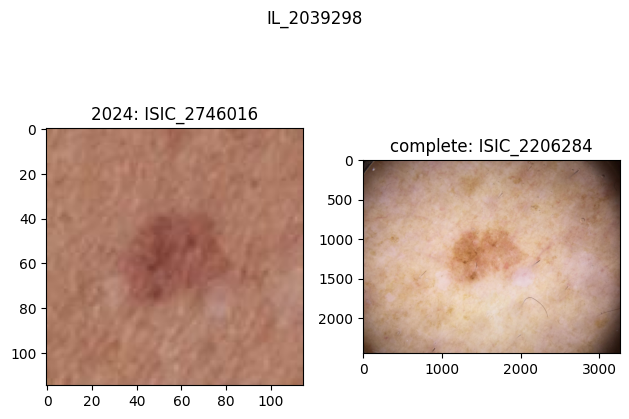

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4764   IL_2041058  ISIC_5753595        2024           benign          
34662  IL_2041058  ISIC_5830274    complete           benign          



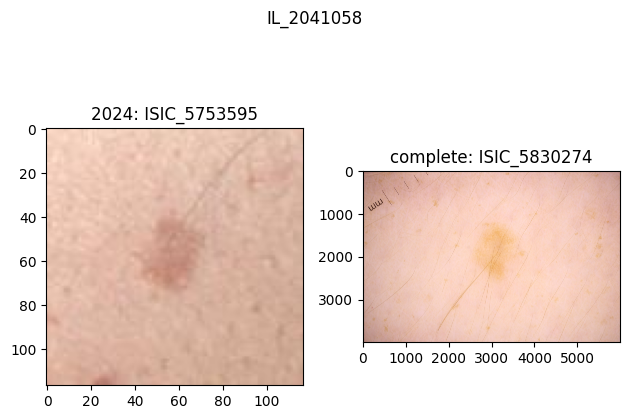

        lesion_id       isic_id PROC_source benign_malignant diagnosis
8060   IL_2198075  ISIC_9777602        2024           benign     nevus
36927  IL_2198075  ISIC_3210830    complete           benign     nevus



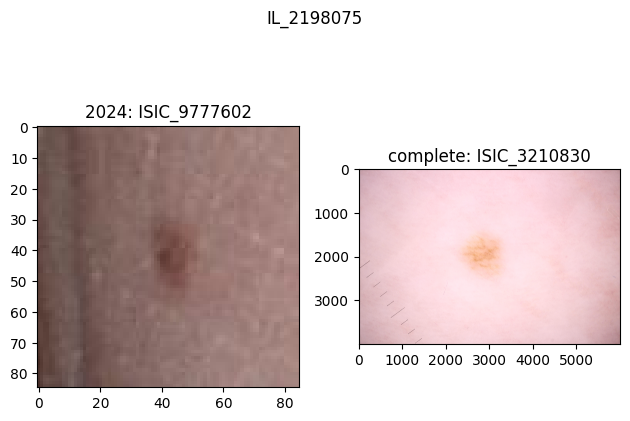

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7989   IL_2262731  ISIC_9690994        2024        malignant  melanoma
10828  IL_2262731  ISIC_8733345    complete        malignant  melanoma



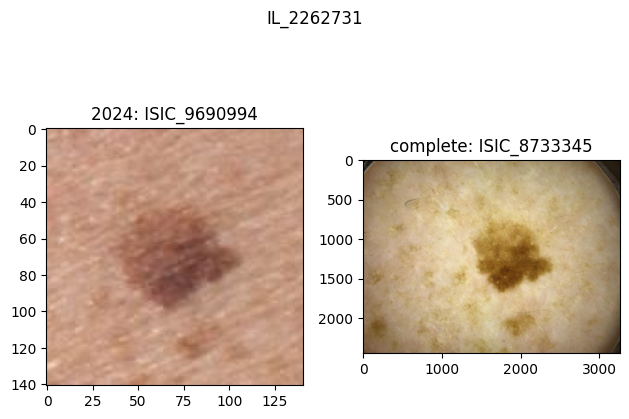

        lesion_id       isic_id PROC_source benign_malignant  \
3667   IL_2317568  ISIC_4416759        2024        malignant   
10505  IL_2317568  ISIC_6821316    complete        malignant   

                  diagnosis  
3667   basal cell carcinoma  
10505  basal cell carcinoma  



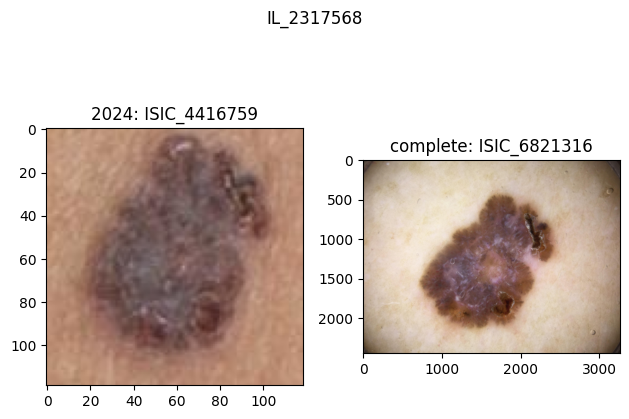

        lesion_id       isic_id PROC_source benign_malignant  \
5171   IL_3129542  ISIC_6242031        2024        malignant   
10367  IL_3129542  ISIC_1979534    complete        malignant   

                     diagnosis  
5171   squamous cell carcinoma  
10367  squamous cell carcinoma  



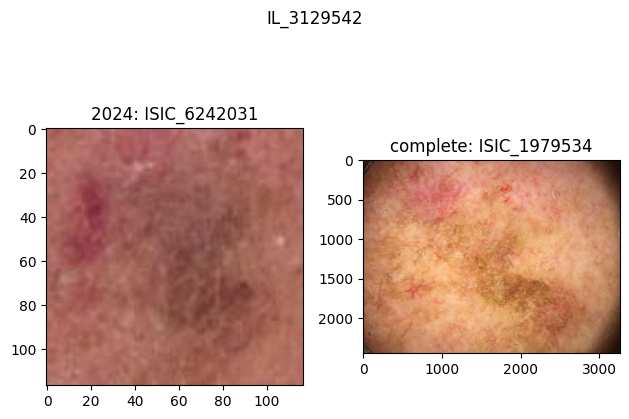

        lesion_id       isic_id PROC_source benign_malignant diagnosis
5957   IL_3206110  ISIC_7231436        2024        malignant  melanoma
39959  IL_3206110  ISIC_0247330    complete        malignant  melanoma



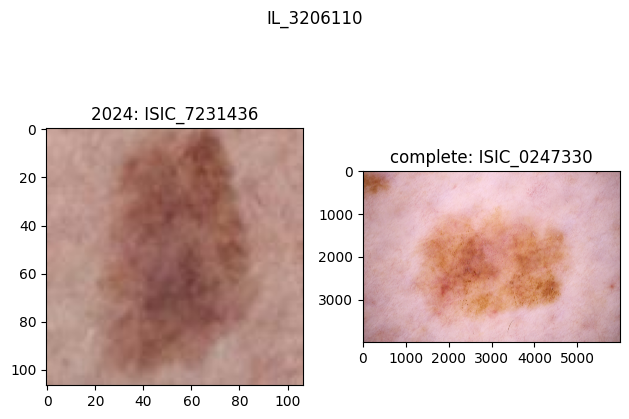

        lesion_id       isic_id PROC_source benign_malignant diagnosis
2910   IL_3301583  ISIC_3541854        2024           benign          
40992  IL_3301583  ISIC_2982630    complete           benign          



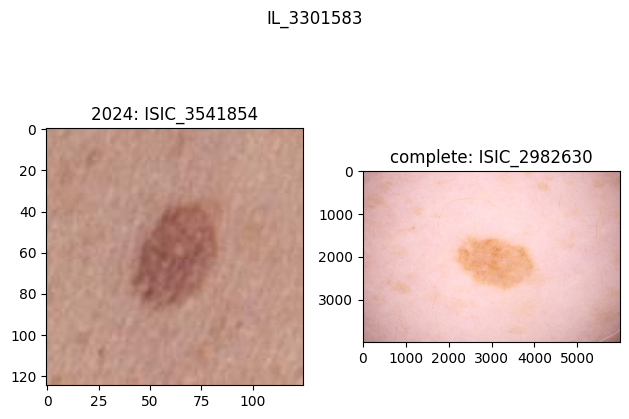

        lesion_id       isic_id PROC_source benign_malignant diagnosis
5816   IL_3304344  ISIC_7054085        2024        malignant  melanoma
42586  IL_3304344  ISIC_6961503    complete        malignant  melanoma



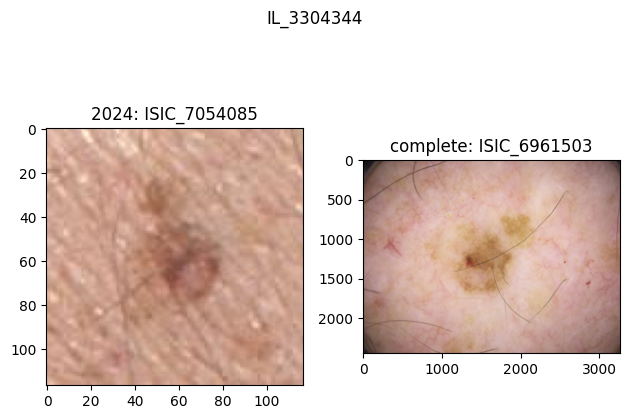

        lesion_id       isic_id PROC_source benign_malignant diagnosis
340    IL_3505443  ISIC_0467830        2024        malignant  melanoma
10406  IL_3505443  ISIC_6119202    complete        malignant  melanoma



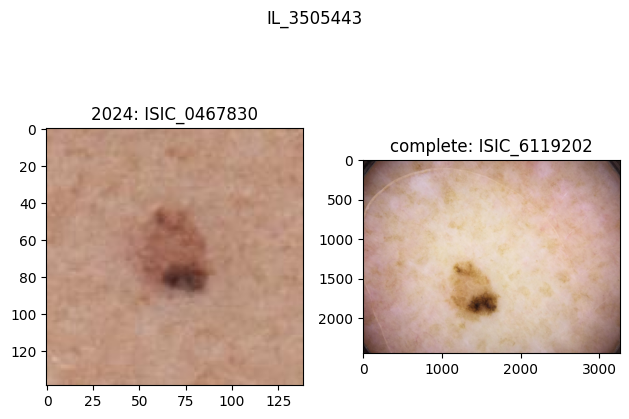

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7197   IL_3965190  ISIC_8764289        2024           benign          
38158  IL_3965190  ISIC_6679694    complete           benign          



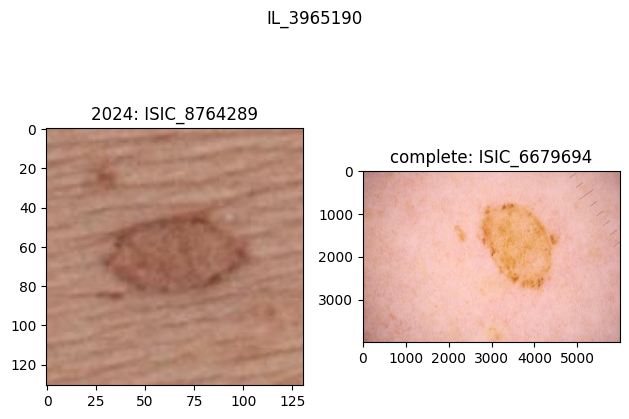

        lesion_id       isic_id PROC_source benign_malignant  \
6331   IL_4039710  ISIC_7676691        2024        malignant   
10510  IL_4039710  ISIC_3565564    complete        malignant   

                     diagnosis  
6331   squamous cell carcinoma  
10510  squamous cell carcinoma  



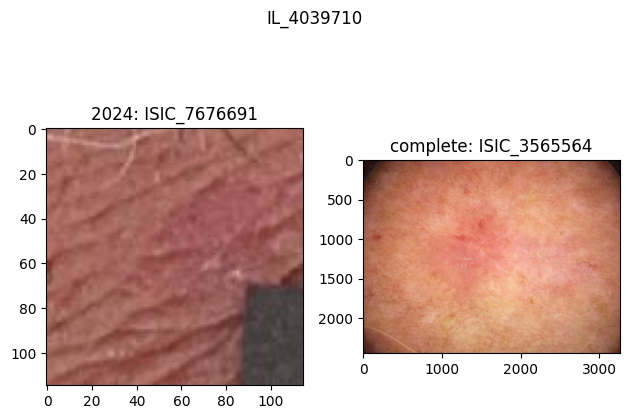

        lesion_id       isic_id PROC_source benign_malignant diagnosis
3937   IL_4056168  ISIC_4747520        2024           benign          
41461  IL_4056168  ISIC_7097343    complete           benign          



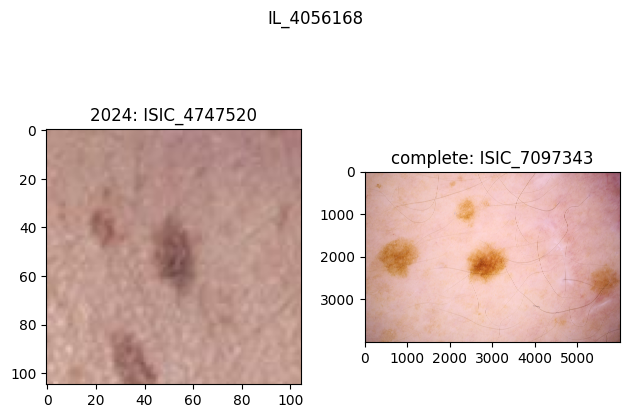

        lesion_id       isic_id PROC_source benign_malignant diagnosis
3038   IL_4157905  ISIC_3705092        2024        malignant  melanoma
10747  IL_4157905  ISIC_5744196    complete        malignant  melanoma



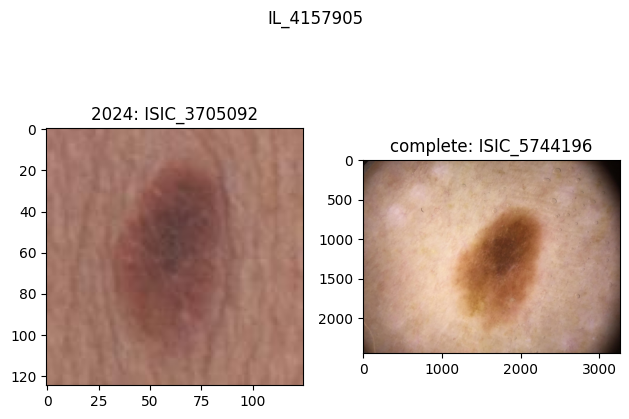

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4188   IL_4386187  ISIC_5029996        2024           benign          
40216  IL_4386187  ISIC_8701243    complete           benign          



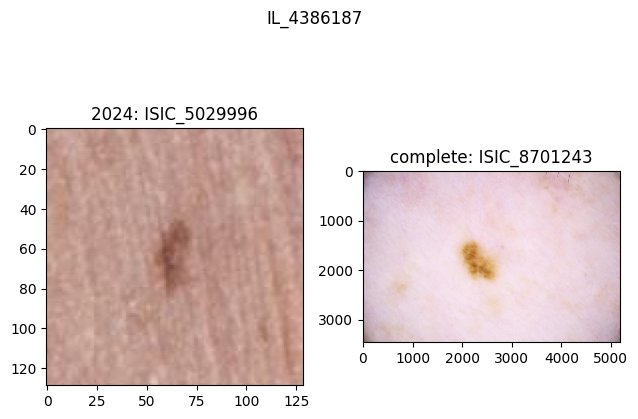

        lesion_id       isic_id PROC_source benign_malignant  \
162    IL_4551160  ISIC_0287900        2024        malignant   
10580  IL_4551160  ISIC_6356149    complete        malignant   

                  diagnosis  
162    basal cell carcinoma  
10580  basal cell carcinoma  



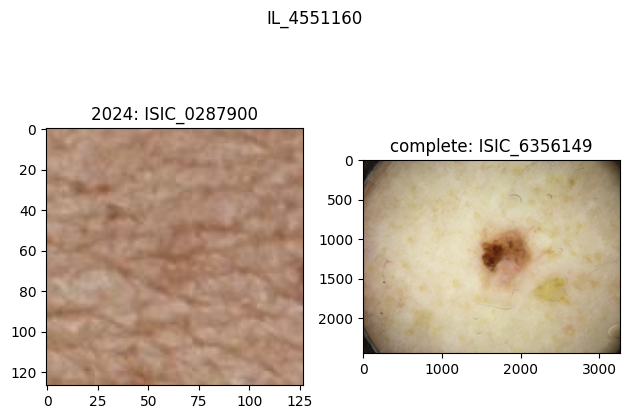

        lesion_id       isic_id PROC_source benign_malignant diagnosis
6294   IL_4895917  ISIC_7632073        2024           benign          
43197  IL_4895917  ISIC_2253931    complete           benign          



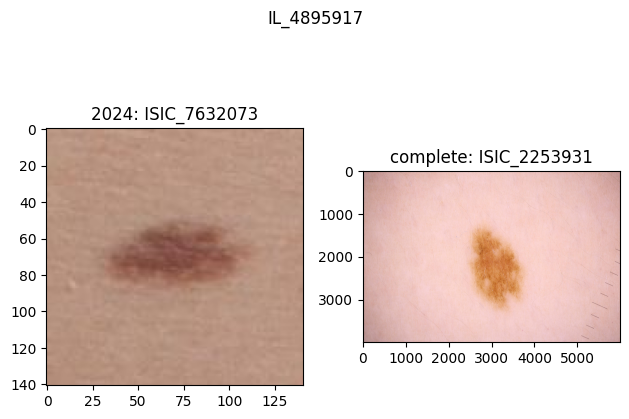

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4975   IL_4908705  ISIC_6002260        2024           benign          
41465  IL_4908705  ISIC_1924949    complete           benign          



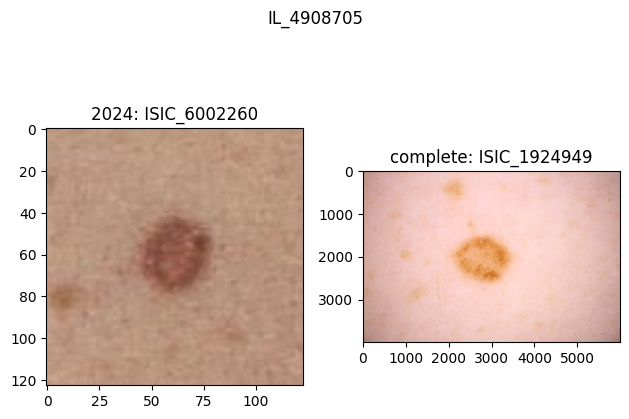

        lesion_id       isic_id PROC_source benign_malignant diagnosis
904    IL_4982960  ISIC_1144927        2024           benign     nevus
10929  IL_4982960  ISIC_4032749    complete           benign     nevus



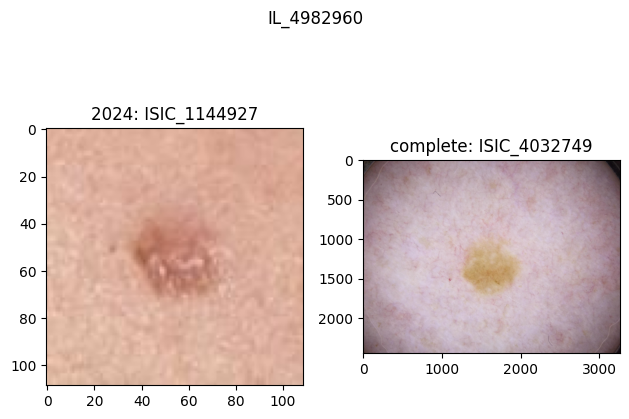

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4124   IL_5082259  ISIC_4959717        2024           benign          
38174  IL_5082259  ISIC_8738598    complete           benign          



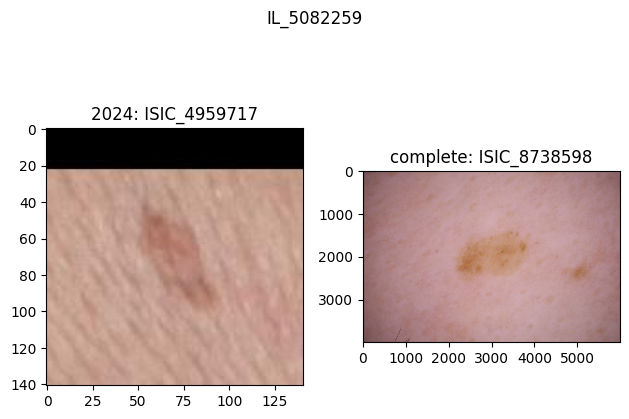

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7612   IL_5153442  ISIC_9242188        2024           benign          
38188  IL_5153442  ISIC_4940947    complete           benign          



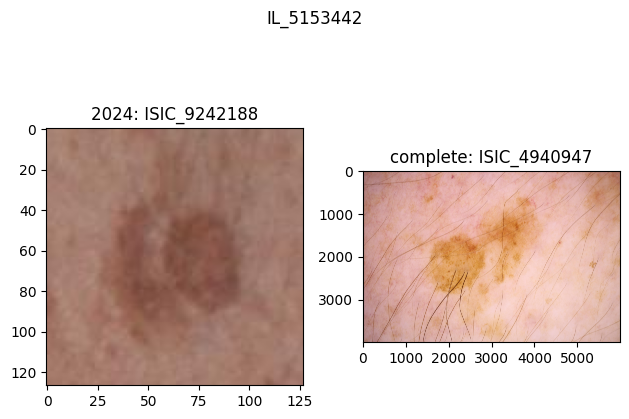

        lesion_id       isic_id PROC_source benign_malignant diagnosis
988    IL_5329041  ISIC_1230482        2024           benign          
34667  IL_5329041  ISIC_5016597    complete           benign          



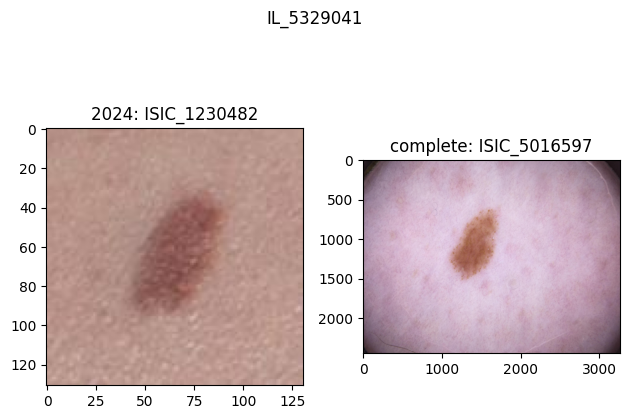

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7760   IL_5332119  ISIC_9403614        2024           benign          
37409  IL_5332119  ISIC_4944690    complete           benign          



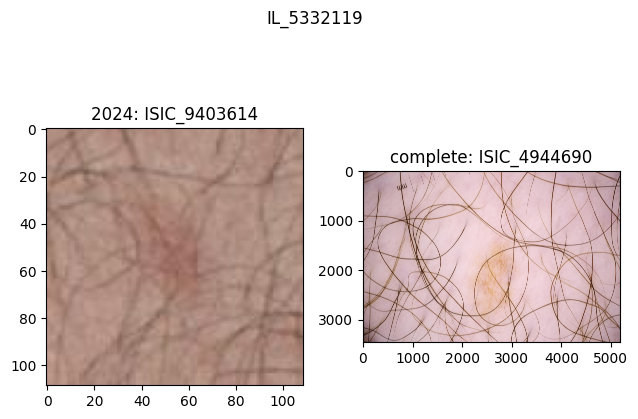

        lesion_id       isic_id PROC_source benign_malignant diagnosis
6029   IL_5454547  ISIC_7316504        2024        malignant  melanoma
10829  IL_5454547  ISIC_0375034    complete        malignant  melanoma



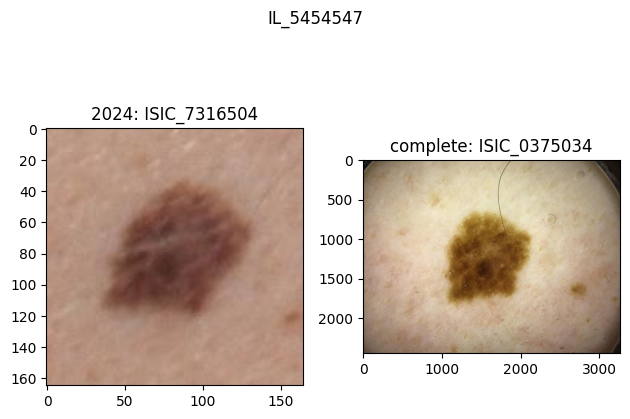

        lesion_id       isic_id PROC_source benign_malignant diagnosis
487    IL_5998599  ISIC_0642741        2024           benign          
40092  IL_5998599  ISIC_6722586    complete           benign          



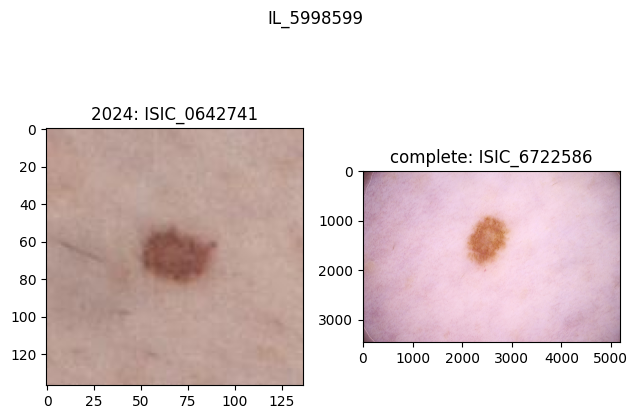

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1884   IL_6009276  ISIC_2299573        2024        malignant  melanoma
10483  IL_6009276  ISIC_3323866    complete        malignant  melanoma



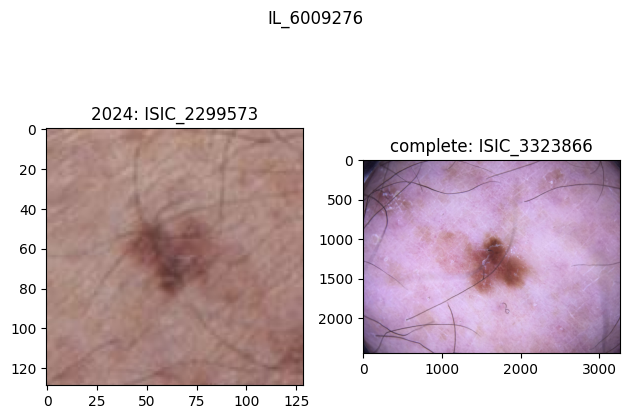

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1236   IL_6262750  ISIC_1505514        2024           benign          
44811  IL_6262750  ISIC_6784305    complete           benign          



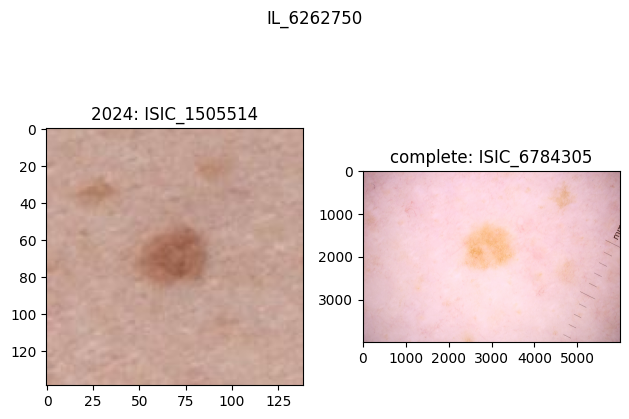

        lesion_id       isic_id PROC_source benign_malignant diagnosis
2998   IL_6375325  ISIC_3655850        2024           benign          
35764  IL_6375325  ISIC_8851038    complete           benign          



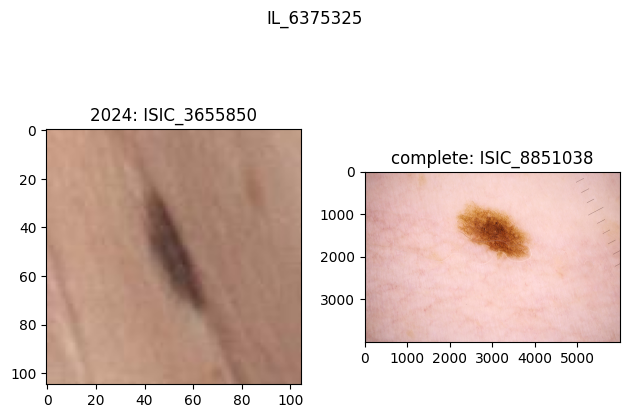

        lesion_id       isic_id PROC_source benign_malignant diagnosis
3568   IL_6716620  ISIC_4311640        2024           benign          
37650  IL_6716620  ISIC_3942426    complete           benign          



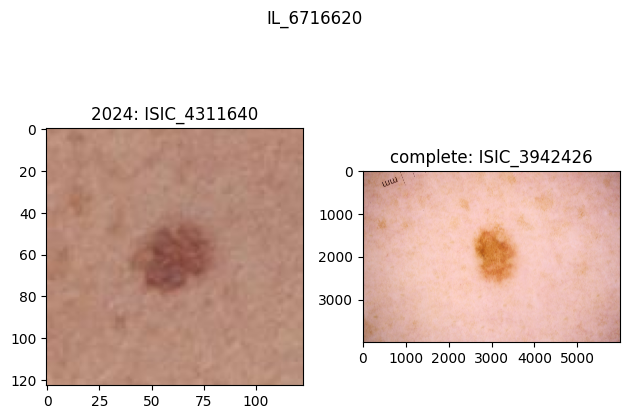

        lesion_id       isic_id PROC_source benign_malignant diagnosis
5450   IL_6723144  ISIC_6571365        2024           benign          
38191  IL_6723144  ISIC_0172020    complete           benign          



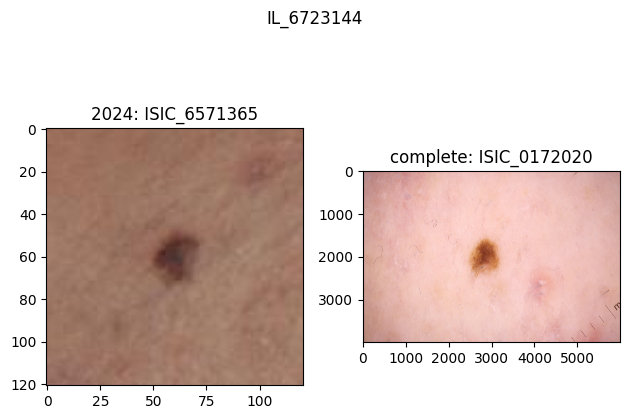

        lesion_id       isic_id PROC_source benign_malignant diagnosis
6356   IL_6750362  ISIC_7703236        2024        malignant  melanoma
38651  IL_6750362  ISIC_1241817    complete        malignant  melanoma



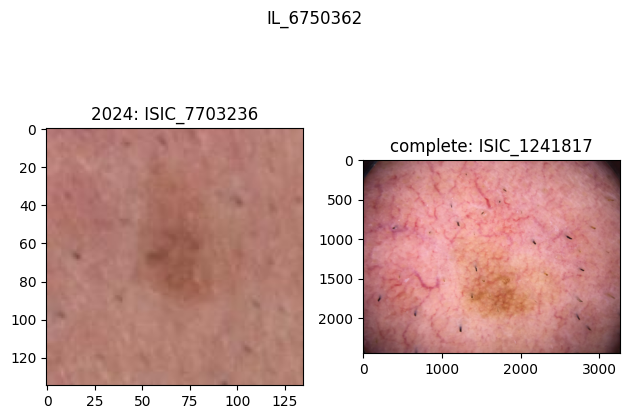

        lesion_id       isic_id PROC_source benign_malignant diagnosis
5002   IL_6754694  ISIC_6035242        2024           benign          
39136  IL_6754694  ISIC_4885417    complete           benign          



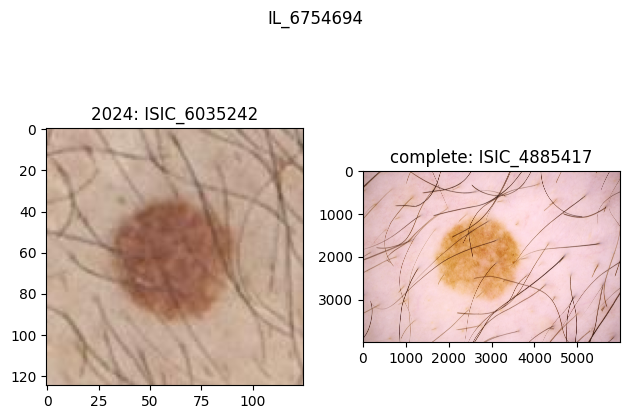

        lesion_id       isic_id PROC_source benign_malignant diagnosis
2599   IL_7149631  ISIC_3156688        2024        malignant  melanoma
42768  IL_7149631  ISIC_3138836    complete           benign          



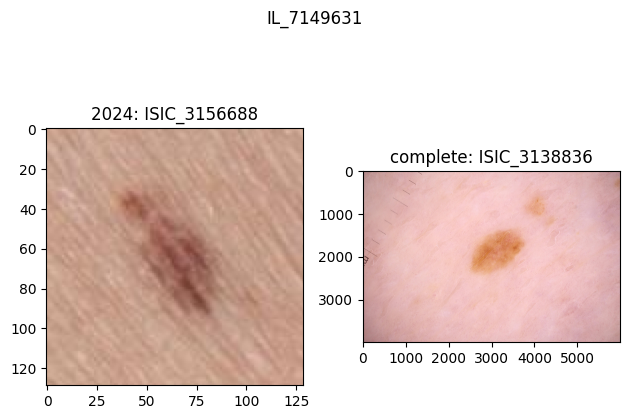

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4690   IL_7347014  ISIC_5661573        2024        malignant  melanoma
10503  IL_7347014  ISIC_1850674    complete        malignant  melanoma



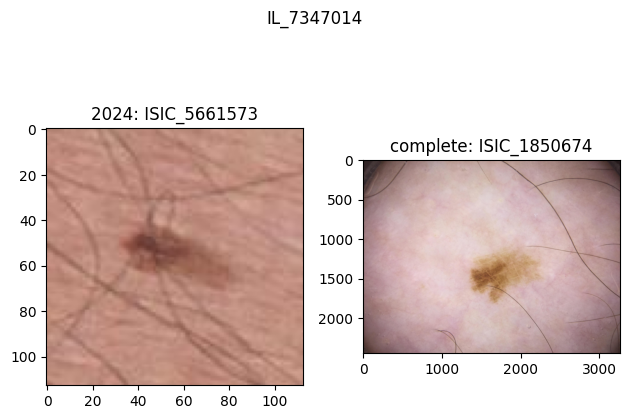

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7810   IL_7870569  ISIC_9452490        2024        malignant  melanoma
35776  IL_7870569  ISIC_0188432    complete        malignant  melanoma



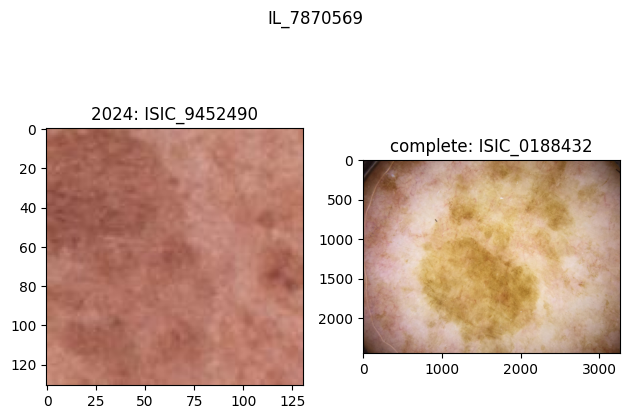

        lesion_id       isic_id PROC_source benign_malignant diagnosis
6699   IL_8104792  ISIC_8129387        2024           benign          
44297  IL_8104792  ISIC_4409799    complete           benign          



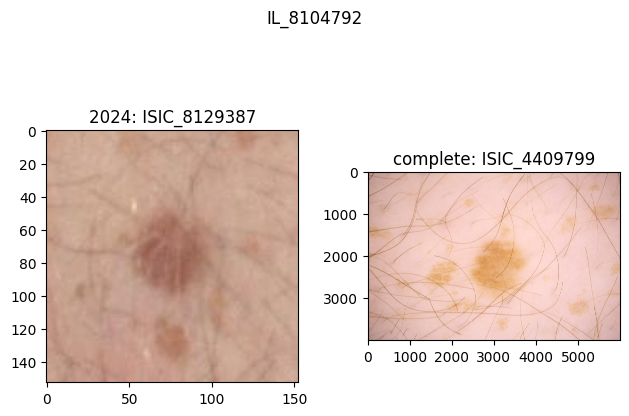

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1216   IL_8206011  ISIC_1480614        2024        malignant  melanoma
10879  IL_8206011  ISIC_5923557    complete        malignant  melanoma



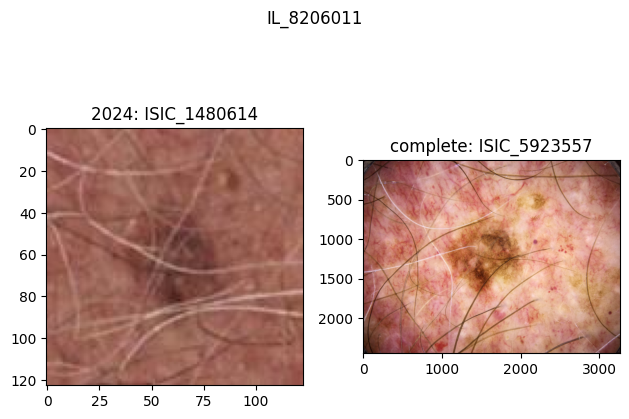

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4543   IL_8283325  ISIC_5471868        2024           benign     nevus
44785  IL_8283325  ISIC_4528136    complete           benign     nevus



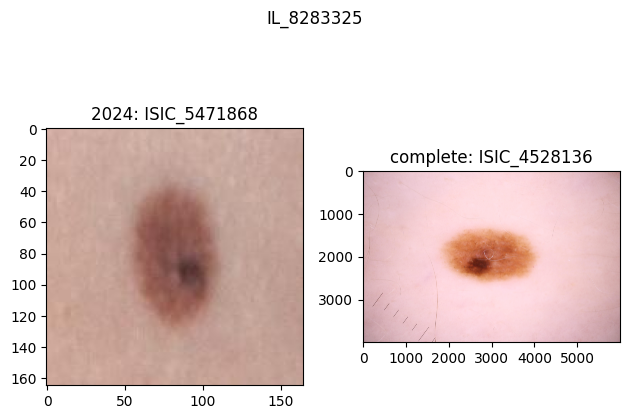

        lesion_id       isic_id PROC_source benign_malignant diagnosis
7120   IL_8558961  ISIC_8662001        2024        malignant  melanoma
10935  IL_8558961  ISIC_6004197    complete        malignant  melanoma
40624  IL_8558961  ISIC_4049598    complete           benign          



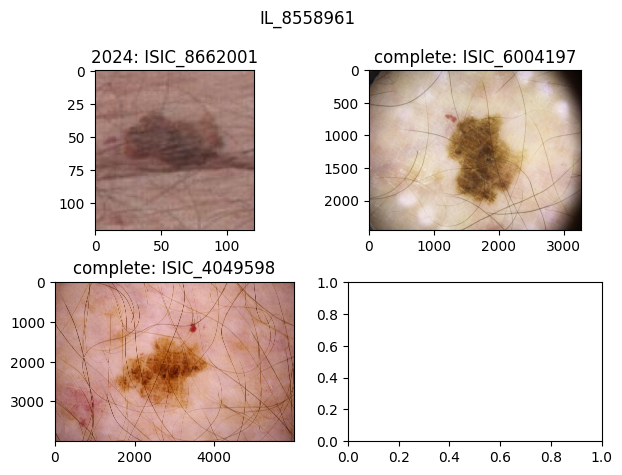

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4566   IL_8736967  ISIC_5507996        2024           benign          
39963  IL_8736967  ISIC_5960641    complete           benign          



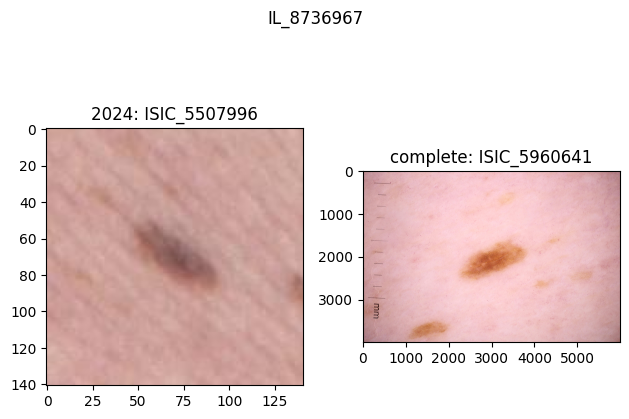

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1672   IL_8876838  ISIC_2039860        2024           benign          
37070  IL_8876838  ISIC_5851666    complete           benign          



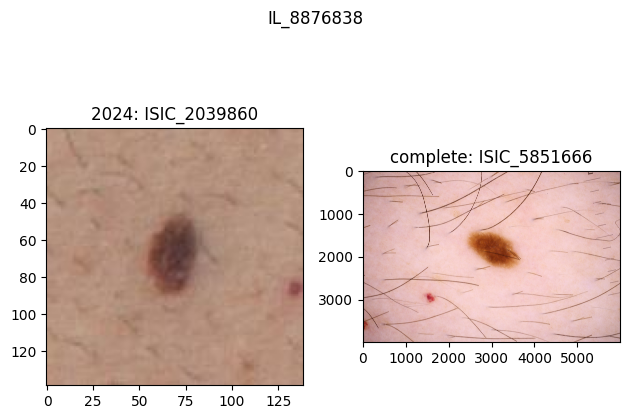

        lesion_id       isic_id PROC_source benign_malignant diagnosis
102    IL_9039913  ISIC_0195136        2024           benign          
38280  IL_9039913  ISIC_7458272    complete           benign          



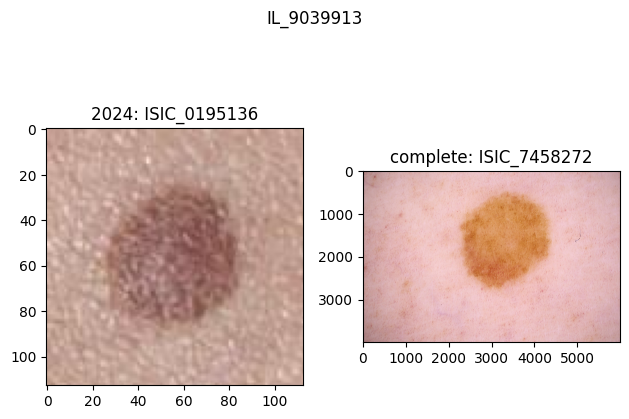

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1614   IL_9106368  ISIC_1965064        2024           benign          
35617  IL_9106368  ISIC_5001033    complete           benign          



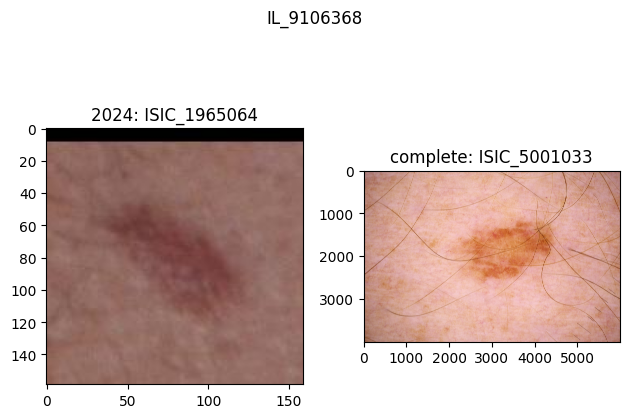

        lesion_id       isic_id PROC_source benign_malignant diagnosis
4093   IL_9380774  ISIC_4925071        2024           benign          
44790  IL_9380774  ISIC_3797095    complete           benign          



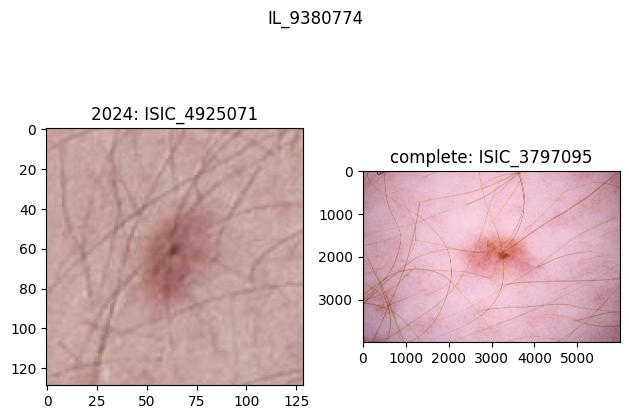

        lesion_id       isic_id PROC_source benign_malignant diagnosis
1175   IL_9435212  ISIC_1426609        2024           benign          
40085  IL_9435212  ISIC_2398801    complete           benign          



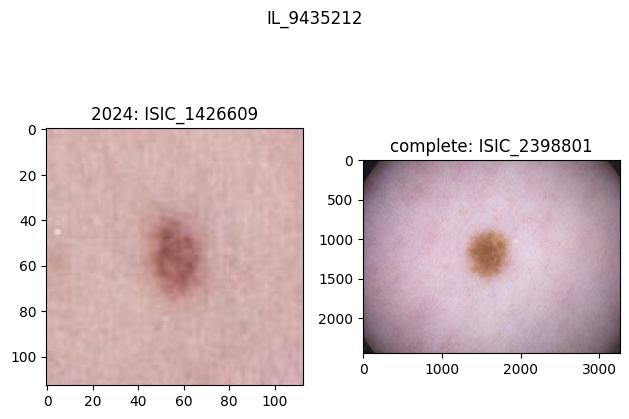

Total number: 52



In [7]:
printenc(
"""\
Study duplicated lesion_ids

Note that for samples with no lesion_id we will never know
what the situation is.

THERE ARE SAMPLES WHERE CONFLICTING DIAGNOSES HAVE BEEN GIVEN!

But the number of those samples is really small and perhaps reflects an uncertainty in the diagnosis.
I'd just say not to worry about it...

There are only 52 samples in the 2024 set that have duplicate lesion_ids,
and they all have their counterparts in the archive set.
COMPARING THESE WILL GIVE US INSIGHT TO WHAT TRANSFORMS WE NEED.\
""")

# same as that in combine, shame on me for using global variables :)
def load_image(row):
    filename = ""

    if row['PROC_source'] == '2024':
        filename = ds_24.get_filename(row['isic_id'])
    elif row['PROC_source'] == 'complete':
        filename = ds_cp.get_filename(row['isic_id'])
        
    assert(filename != "")
    image = Image.open(filename)
    return image

# If you don't filter out nan you will see an entry with 24945 duplicates..!
md_dup_counts = md_final[md_final['lesion_id'] != '']\
                    .pivot_table(index = ['lesion_id'], aggfunc ='size')

printenc("Duplicate statistics (how many duplicates in each lesion_id?)",
         md_dup_counts.value_counts())

printenc("How many samples don't have a lesion_id?",
         md_final[md_final['lesion_id'] == ''].shape[0])

# full list of non-na duplicated samples
md_dupes = md_final[md_final.duplicated('lesion_id', keep = False)]
md_dupes = md_dupes[md_dupes['lesion_id'] != '']
printenc("Source of duplicate lesion_ids (unique ids)",
         # so that duplicates across different sources are both preserved
         md_dupes.drop_duplicates(['lesion_id', 'PROC_source'])['PROC_source'].value_counts())

printenc("Total number of unique lesion_ids",
         len(md_final['lesion_id'].unique()))

COL_INTEREST = ['lesion_id', 'isic_id', 'PROC_source', 'benign_malignant', 'diagnosis']

printenc("Same lesion_id, different labels")
for name, group in md_dupes.groupby('lesion_id'):
    if len(group['label'].unique()) > 1:
        println(group[COL_INTEREST])

printenc("Same lesion_id, both in archive and 2024")
dup_cp_24_cnt = 0

for name, group in md_dupes.groupby('lesion_id'):
    if len(group['PROC_source'].value_counts()) > 1:
        println(group[COL_INTEREST])
        dup_cp_24_cnt += 1

        fig, axs = plt.subplots(int(np.ceil(group.shape[0] / 2)),
                                2,
                                squeeze = False)

        for i, row in group.reset_index(drop = True).iterrows():
            isic_id = row['isic_id']
            source = row['PROC_source']
            axs[i // 2, i % 2].imshow(load_image(row))
            axs[i // 2, i % 2].set_title(f"{source}: {isic_id}")

        fig.suptitle(name)
        fig.tight_layout()
        plt.show()

println("Total number:", dup_cp_24_cnt)